In [1]:
from pandas_datareader import data as pdr
from datetime import date
import yfinance as yf
yf.pdr_override()
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup as bs
import requests
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# S&P 500 Companies by Weight

headers='Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/84.0.4147.89 Safari/537.36'<br>
url='https://www.slickcharts.com/sp500'<br>
page=requests.get(url,headers)<br>
soup=bs(page.content,'html.parser')<br>
tab=soup.find('table',class_='table table-hover table-borderless table-sm')<br>
links=tab.findAll('a')

name=[]<br>
tick=[]<br>
for i in range(0,len(links)): 
    
    if i%2==0:
        name.append(links[i].text)
    else:
        tick.append(links[i].text)

dt=pd.DataFrame(name,columns=['Company'])<br>
dt['Ticker']=tick<br>
dt.to_csv('500_symbols.csv')

In [2]:
dt=pd.read_csv('500_symbols.csv')

In [3]:
dt.drop('Unnamed: 0',axis=1,inplace=True)

In [4]:
dt

,Company,Ticker
0,Microsoft Corporation,MSFT
1,Apple Inc.,AAPL
2,Amazon.com Inc.,AMZN
3,Facebook Inc. Class A,FB
4,Alphabet Inc. Class A,GOOGL
...,...,...
500,Gap Inc.,GPS
501,Under Armour Inc. Class A,UAA
502,Under Armour Inc. Class C,UA
503,News Corporation Class B,NWS


There are 505 symbols due to several companies with two share classes. For example, Google's parent company Alphabet has Class A (GOOGL) and Class C (GOOG) shares in the index.

Function to merge all tickets info
<br>
lst=[]
<br>
for i in dt['Ticker'].unique():
  
    today=date.today()
    info=pdr.get_data_yahoo(i,start='2015-01-01',end=today)
    info.columns = pd.MultiIndex.from_product([['%s'%i],info.columns])
    d=pd.DataFrame(info)
    lst.append(d)
    df=pd.concat(lst,axis=1)      

Extract to the csv file name top_500.csv<br>
dt.to_csv('top_500.csv')

In [5]:
df=pd.read_csv('top_500.csv', index_col=[0], header=[0,1])
df

MSFT                                                  \
                  Open        High         Low       Close   Adj Close   
Date                                                                     
2014-12-31   46.730000   47.439999   46.450001   46.450001   41.471783   
2015-01-02   46.660000   47.419998   46.540001   46.759998   41.748566   
2015-01-05   46.369999   46.730000   46.250000   46.330002   41.364658   
2015-01-06   46.380001   46.750000   45.540001   45.650002   40.757530   
2015-01-07   45.980000   46.459999   45.490002   46.230000   41.275364   
...                ...         ...         ...         ...         ...   
2020-07-22  209.199997  212.300003  208.389999  211.750000  211.750000   
2020-07-23  207.190002  210.919998  202.149994  202.539993  202.539993   
2020-07-24  200.419998  202.860001  197.509995  201.300003  201.300003   
2020-07-27  201.470001  203.970001  200.860001  203.850006  203.850006   
2020-07-28  203.610001  204.699997  201.740005  202.020004  202.020004   

                              AAPL                                      ...  \
                Volume        Open        High         Low       Close  ...   
Date                                                                    ...   
2014-12-31  21552500.0  112.820000  113.129997  110.209999  110.379997  ...   
2015-01-02  27913900.0  111.389999  111.440002  107.349998  109.330002  ...   
2015-01-05  39673900.0  108.290001  108.650002  105.410004  106.250000  ...   
2015-01-06  36447900.0  106.540001  107.430000  104.629997  106.260002  ...   
2015-01-07  29114100.0  107.199997  108.199997  106.699997  107.750000  ...   
...                ...         ...         ...         ...         ...  ...   
2020-07-22  49605700.0  386.769989  391.899994  386.410004  389.089996  ...   
2020-07-23  67457000.0  387.989990  388.309998  368.040009  371.380005  ...   
2020-07-24  39827000.0  363.950012  371.880005  356.579987  370.459991  ...   
2020-07-27  30160900.0  374.839996  379.619995  373.920013  379.239990  ...   
2020-07-28  23230100.0  377.470001  378.200012  372.989990  373.010010  ...   

              NWS                                    COTY             \
              Low  Close  Adj Close     Volume       Open       High   
Date                                                                   
2014-12-31  15.07  15.08  13.972545   644100.0  20.889999  20.990000   
2015-01-02  14.80  14.98  13.879889   905000.0  20.760000  21.059999   
2015-01-05  14.53  14.64  13.564858  1018500.0  20.400000  20.660000   
2015-01-06  14.32  14.47  13.407343  1197100.0  20.400000  20.459999   
2015-01-07  14.25  14.41  13.351748  1074300.0  20.270000  20.469999   
...           ...    ...        ...        ...        ...        ...   
2020-07-22  12.77  12.85  12.850000   216400.0   4.120000   4.170000   
2020-07-23  12.71  12.73  12.730000   315900.0   4.060000   4.250000   
2020-07-24  12.67  12.71  12.710000   249900.0   4.130000   4.200000   
2020-07-27  12.68  12.91  12.910000   249100.0   4.000000   4.010000   
2020-07-28  12.67  12.73  12.730000   551600.0   3.940000   4.120000   

                                                         
                  Low      Close  Adj Close      Volume  
Date                                                     
2014-12-31  20.660000  20.660000  17.796223    373900.0  
2015-01-02  20.360001  20.430000  17.598106    686000.0  
2015-01-05  20.270000  20.370001  17.546425    735600.0  
2015-01-06  20.100000  20.219999  17.417217   1878300.0  
2015-01-07  20.150000  20.290001  17.477512   1191300.0  
...               ...        ...        ...         ...  
2020-07-22   4.060000   4.120000   4.120000   7069900.0  
2020-07-23   4.060000   4.170000   4.170000   6793900.0  
2020-07-24   3.980000   4.010000   4.010000  12723900.0  
2020-07-27   3.870000   4.010000   4.010000  10090200.0  
2020-07-28   3.940000   4.070000   4.070000   7923400.0  

[1408 rows x 3030 columns]

# Open data information of 3641 companies in NASDAG

In [6]:
df1=pd.read_csv('companylist.csv')

In [7]:
df1.columns

Index(['Symbol', 'Name', 'LastSale', 'MarketCap', 'IPOyear', 'Sector',
       'industry', 'Summary Quote', 'Unnamed: 8'],
      dtype='object')

In [8]:
df1.drop(['Unnamed: 8','Summary Quote'],axis=1,inplace=True)

In [9]:
df1.rename(columns={'Name':'Company','industry':'Industry'},inplace=True)

In [10]:
df1['MarketCap']=df1['MarketCap'].str.replace('$','')

In [11]:
a=[]
for i in df1['MarketCap']:
    i=str(i)
    if 'B' in i:
        i=i.replace('B','')
        i=float(i)
        i=i*1000
        a.append(i)
    elif 'M' in i:
        i=i.replace('M','')
        i=float(i)
        a.append(i)
    else:
        a.append(np.nan)

In [12]:
#df['MarketCap_mil_dollar']=a
df1.insert(4,'MarketCap_mil_dollar',a)

In [13]:
df1

,Symbol,Company,LastSale,MarketCap,MarketCap_mil_dollar,IPOyear,Sector,Industry
0,TXG,"10x Genomics, Inc.",94.6100,9.31B,9310.00,2019.0,Capital Goods,Biotechnology: Laboratory Analytical Instruments
1,YI,"111, Inc.",6.8000,560.04M,560.04,2018.0,Health Care,Medical/Nursing Services
2,PIH,"1347 Property Insurance Holdings, Inc.",4.5201,27.43M,27.43,2014.0,Finance,Property-Casualty Insurers
3,PIHPP,"1347 Property Insurance Holdings, Inc.",24.9000,NaN,NaN,NaN,Finance,Property-Casualty Insurers
4,TURN,180 Degree Capital Corp.,1.7500,54.46M,54.46,NaN,Finance,Finance/Investors Services
...,...,...,...,...,...,...,...,...
3636,ZS,"Zscaler, Inc.",125.1100,16.33B,16330.00,2018.0,Technology,EDP Services
3637,ZUMZ,Zumiez Inc.,26.0500,662.47M,662.47,2005.0,Consumer Services,Clothing/Shoe/Accessory Stores
3638,ZYNE,"Zynerba Pharmaceuticals, Inc.",3.7100,92.57M,92.57,2015.0,Health Care,Major Pharmaceuticals
3639,ZYXI,"Zynex, Inc.",21.5600,722.15M,722.15,NaN,Health Care,Biotechnology: Electromedical & Electrotherape...


In [14]:
df1.dtypes

Symbol                   object
Company                  object
LastSale                float64
MarketCap                object
MarketCap_mil_dollar    float64
IPOyear                 float64
Sector                   object
Industry                 object
dtype: object

Text(0.5, 1, 'Missing values')

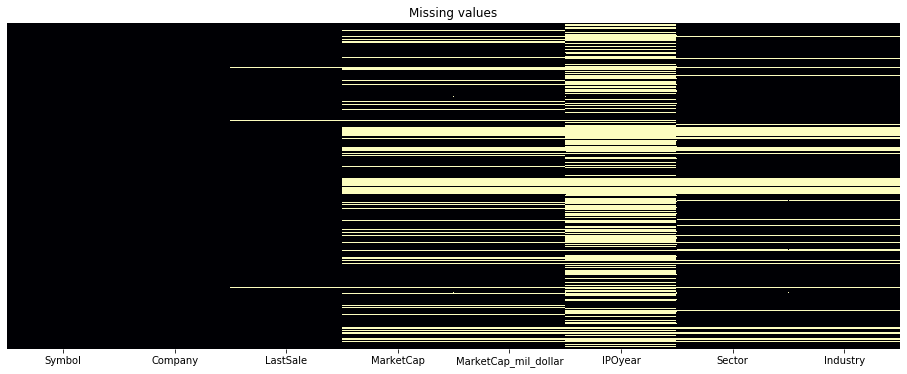

In [15]:
plt.figure(figsize=(16,6))
sns.heatmap(df1.isnull(),cbar=False,cmap='magma',yticklabels=False)
plt.title('Missing values')

In [16]:
df1.sort_values('MarketCap_mil_dollar',ascending=False,inplace=True)

In [17]:
df1.reset_index(drop=True,inplace=True)

In [18]:
#Sorting dataframe following descending MarketCap_mil_dollar
df1

,Symbol,Company,LastSale,MarketCap,MarketCap_mil_dollar,IPOyear,Sector,Industry
0,AAPL,Apple Inc.,389.0900,1686.45B,1686450.0,1980.0,Technology,Computer Manufacturing
1,MSFT,Microsoft Corporation,211.7500,1605.79B,1605790.0,1986.0,Technology,Computer Software: Prepackaged Software
2,AMZN,"Amazon.com, Inc.",3099.9100,1546.16B,1546160.0,1997.0,Consumer Services,Catalog/Specialty Distribution
3,GOOG,Alphabet Inc.,1568.4900,1070.68B,1070680.0,2004.0,Technology,"Computer Software: Programming, Data Processing"
4,GOOGL,Alphabet Inc.,1564.8500,1068.2B,1068200.0,NaN,Technology,"Computer Software: Programming, Data Processing"
...,...,...,...,...,...,...,...,...
3636,ZNWAA,Zion Oil,NaN,NaN,NaN,NaN,Energy,Oil & Gas Production
3637,ZIONL,Zions Bancorporation N.A.,26.9100,NaN,NaN,NaN,Finance,Major Banks
3638,ZIONN,Zions Bancorporation N.A.,25.0500,NaN,NaN,NaN,Finance,Major Banks
3639,ZIONO,Zions Bancorporation N.A.,26.2000,NaN,NaN,NaN,Finance,Major Banks


In [19]:
df1.to_csv('nasdag_symbols.csv')

In [20]:
df1['Sector'].value_counts()

Health Care              808
Finance                  761
Technology               455
Consumer Services        360
Capital Goods            176
Consumer Non-Durables    109
Miscellaneous             95
Consumer Durables         75
Basic Industries          75
Energy                    63
Public Utilities          60
Transportation            55
Name: Sector, dtype: int64

In [21]:
df1['Industry'].value_counts()

Major Pharmaceuticals                                            448
Major Banks                                                      291
Business Services                                                289
Biotechnology: Biological Products (No Diagnostic Substances)    131
Computer Software: Prepackaged Software                          115
                                                                ... 
Diversified Electronic Products                                    1
Precision Instruments                                              1
Paper                                                              1
Diversified Financial Services                                     1
Accident &Health Insurance                                         1
Name: Industry, Length: 128, dtype: int64

# Technical analysis indicators

## On-Balance-Volume (OBV)
On-balance volume (OBV) is a technical trading momentum indicator that uses volume flow to predict changes in stock price. Joseph Granville first developed the OBV metric in the 1963 book Granville's New Key to Stock Market Profits.

KEY TAKEAWAYS On-balance volume (OBV) is a technical indicator of momentum, using volume changes to make price predictions. OBV shows crowd sentiment that can predict a bullish or bearish outcome. Comparing relative action between price bars and OBV generates more actionable signals than the green or red volume histograms commonly found at the bottom of price charts.

Calculating OBV On-balance volume provides a running total of an asset's trading volume and indicates whether this volume is flowing in or out of a given security or currency pair. The OBV is a cumulative total of volume (positive and negative). There are three rules implemented when calculating the OBV. They are:

If today's closing price is higher than yesterday's closing price, then: Current OBV = Previous OBV + today's volume

If today's closing price is lower than yesterday's closing price, then: Current OBV = Previous OBV - today's volume

If today's closing price equals yesterday's closing price, then: Current OBV = Previous OBV

What Does On-Balance Volume Tell You? The theory behind OBV is based on the distinction between smart money – namely, institutional investors – and less sophisticated retail investors. As mutual funds and pension funds begin to buy into an issue that retail investors are selling, volume may increase even as the price remains relatively level. Eventually, volume drives the price upward. At that point, larger investors begin to sell, and smaller investors begin buying.

In [22]:
# On-balance-Volume (OBV): the OBV will tend to follow the general trend of the market. It will tend to increase in uptrends and decrease in downtrends.
# Compute obv for one company
def on_balance_volume(ticker, trend_periods):    # ticker = symbol of stock
    # data = info(ticker)
    data = df[ticker]
    data = data.reset_index(drop=False)
    obv = []
    for index, row in data.iterrows():
        if index > 0:
            last_obv = result.at[index - 1, 'obv']
            if row['Close'] > data.at[index - 1, 'Close']:
                current_obv = last_obv + row['Volume']
            elif row['Close'] < data.at[index - 1, 'Close']:
                current_obv = last_obv - row['Volume']
            else:
                current_obv = last_obv
        else:
            last_obv = 0
            current_obv = row['Volume']

        obv.append(current_obv)
        result = pd.DataFrame({'obv': obv})

    result['obv_ema' + str(trend_periods)] = result['obv'].ewm(ignore_na=False, min_periods=0, com=trend_periods, adjust=True).mean()
    data = pd.concat([data,result], axis=1)
    data = data.set_index('Date')
    return data


In [23]:
on_balance_volume('AAPL', 21)

,Open,High,Low,Close,Adj Close,Volume,obv,obv_ema21
Date,,,,,,,,
2014-12-31,112.820000,113.129997,110.209999,110.379997,100.905785,41403400.0,41403400.0,4.140340e+07
2015-01-02,111.389999,111.440002,107.349998,109.330002,99.945885,53204600.0,-11801200.0,1.418244e+07
2015-01-05,108.290001,108.650002,105.410004,106.250000,97.130241,64285500.0,-76086700.0,-1.731739e+07
2015-01-06,106.540001,107.430000,104.629997,106.260002,97.139420,65797100.0,-10289600.0,-1.543601e+07
2015-01-07,107.199997,108.199997,106.699997,107.750000,98.501518,40105900.0,29816300.0,-5.524538e+06
...,...,...,...,...,...,...,...,...
2020-07-22,386.769989,391.899994,386.410004,389.089996,389.089996,22250400.0,625378300.0,5.058638e+08
2020-07-23,387.989990,388.309998,368.040009,371.380005,371.380005,49251100.0,576127200.0,5.090576e+08
2020-07-24,363.950012,371.880005,356.579987,370.459991,370.459991,46359700.0,529767500.0,5.099990e+08


In [24]:
def obv_fig(ticker, periods):
    data = on_balance_volume(ticker, periods)
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.3)
    fig.add_trace(go.Candlestick(x = data.index,
                                 open = data['Open'],
                                 high = data['High'],
                                 low = data['Low'],
                                 close = data['Close'],
                                 name = 'Stock price'), 
                  row = 1, col = 1)

    avg_adj = data.Close.rolling(window=21, min_periods=1).mean()
    fig.add_trace(go.Scatter(x = data.index, 
                             y = avg_adj,
                             line = dict(color='blue', width=1, dash='dash'),
                             name = 'Close,' + str(periods) + '-Day EMA'),
                  row = 1, col = 1)

    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['obv'],
                             mode = 'lines',
                             line_width = 1,
                             name = 'OBV'),
                  row = 2, col = 1)

    fig.update_yaxes(title = "Stock Price", row = 1, col = 1, side = 'right')
    fig.update_yaxes(title = "On-Balance-Volume", row = 2, col = 1, side = 'right')
    fig.update_layout(title = ticker +' '+'Stock', showlegend = False)

    return fig.show()

In [25]:
obv_fig('AAPL', 21)

##  Accumulation/Distribution Line (A/D line) 

Accumulation/distribution is a cumulative indicator that uses **volume** and **price** to assess whether a stock is being accumulated or distributed. The accumulation/distribution measure seeks to identify *divergences* between the stock price and volume flow. This provides insight into how strong a trend is. If the price is rising but the indicator is falling this indicates that buying or accumulation volume may not be enough to support the price rise and a price decline could be forthcoming.

The accumulation/distribution line gauges supply and demand by looking at where the price closed within the period's range, and then multiplying that by volume.

**The Formula** 
            
  1. Money Flow Multiplier = [(Close  -  Low) - (High - Close)] /(High - Low) 

  2. Money Flow Volume = Money Flow Multiplier x Volume for the Period

  3. ADL = Previous ADL + Current Period's Money Flow Volume
  
*How to Calculate the Accumulation/Distribution Line*

- Start by calculating the multiplier. Note the most recent period's close, high, and low to calculate.
- Use the multiplier and the current period's volume to calculate the Money Flow Volume.
- Add the Money Flow Volume to the last A/D value. For the first calculation use Money Flow Volume as the first value.
- Repeat the process as each period ends, adding/subtracting the new Money Flow Volume to/from the prior total. This is A/D.

In [26]:
def ADL_info(ticker):
    data_today=df[ticker]
    data_today['MFM'] =((data_today['High'] - data_today['Low'])-(data_today['High'] - data_today['Close']))/(data_today['High'] - data_today['Low'])
    data_today['MFV'] = (data_today['MFM'] * data_today['Volume']) 
    data_today['ADL'] = data_today['MFV'].rolling(2).sum()
    data_today['ADL'].fillna(0,inplace = True)
    data_today['dif'] = (data_today['ADL'] - data_today['ADL'].shift(1)).fillna(0)
    data_today['ADL_sig'] = data_today['dif'].apply(lambda x : 'uptrend' if x > 0 else 'downtrend')
    #data_today.drop(['Open','High','Low','Close','Adj Close','Volume','MFM','MFV','ADL','dif'], axis = 1, inplace = True)
    #index = data_today.index
    #fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.23)
    #fig.add_trace(go.Candlestick(
        #x = index,
        #open = data_today['Open'], high = data_today['High'],
        #low = data_today['Low'], close = data_today['Close']),
        #row = 1, col = 1
    #)
    #fig.add_trace(go.Scatter(x= index, y = data_today['ADL'], mode = 'lines', name= 'Accumulation/Distribution Line'), row = 2, col = 1)
    #fig.update_layout(title= 'Stock price and Accumulation/Distribution Line',
                      #showlegend=False,
#                   autosize=False, width=950,height=800,
                      #)
    #fig.show()
    return data_today['ADL_sig']

In [27]:
ADL_info('AAPL')

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/panda

Date
2014-12-31    downtrend
2015-01-02      uptrend
2015-01-05      uptrend
2015-01-06      uptrend
2015-01-07      uptrend
                ...    
2020-07-22    downtrend
2020-07-23      uptrend
2020-07-24      uptrend
2020-07-27      uptrend
2020-07-28    downtrend
Name: ADL_sig, Length: 1408, dtype: object

## Average Directional Index - ADX
The average directional index (ADX) is a technical analysis indicator used by some traders to determine the strength of a trend. The trend can be either up or down, and this is shown by two accompanying indicators, the Negative Directional Indicator (-DI) and the Positive Directional Indicator (+DI). Therefore, ADX commonly includes three separate lines. These are used to help assess whether a trade should be taken long or short, or if a trade should be taken at all.

Calculating the Average Directional Movement Index (ADX)

Calculate +DM, -DM, and True Range (TR) for each period. 14 periods are typically used.
+DM = Current High - Previous High.
-DM = Previous Low - Current Low.
Use +DM when Current High - Previous High > Previous Low - Current Low. Use -DM when Previous Low - Current Low > Current High - Previous High.
TR is the greater of the Current High - Current Low, Current High - Previous Close, or Current Low - Previous Close.
Smooth the 14-period averages of +DM, -DM, and TR. The TR formula is below. Insert the -DM and +DM values to calculate the smoothed averages of those.
First 14TR = Sum of first 14 TR readings.
Next 14TR value = First 14TR - (Prior 14TR/14) + Current TR
Next, divide the smoothed +DM value by the smoothed TR value to get +DI. Multiply by 100.
Divide the smoothed -DM value by the smoothed TR value to get-DI. Multiply by 100.
The Directional Movement Index (DX) is +DI minus -DI, divided by the sum of +DI and -DI (all absolute values). Multiply by 100.
To get the ADX, continue to calculate DX values for at least 14 periods. Then, smoothe the results to get ADX
First ADX = sum 14 periods of DX / 14
After that, ADX = ((Prior ADX * 13) + Current DX) /14
What Does the Average Directional Index (ADX) Tell You? The Average Directional Index (ADX) along with the Negative Directional Indicator (-DI) and the Positive Directional Indicator (+DI) are momentum indicators. The ADX helps investors determine trend strength while -DI and +DI help determine trend direction.

The ADX identifies a strong trend when the ADX is over 25 and a weak trend when the ADX is below 20.

Crossovers of the -DI and +DI lines can be used to generate trade signals. For example,

if the +DI line crosses above the -DI line and the ADX is above 20, or ideally above 25, then that is a potential signal to buy.
If the -DI crosses above the +DI, and ADX is above 20 or 25, then that is an opportunity to enter a potential short trade.
Crosses can also be used to exit current trades. For example, if long, exit when the -DI crosses above the +DI.

When ADX is below 20 the indicator is signaling that the price is trendless, and therefore may not be an ideal time to enter a trade.

In [28]:
def average_true_range(ticker, trend_periods=14): # Compute average true range
    # data = info(ticker)
    data = df[ticker]
    data = data.reset_index(drop=False)
    atr = []
    for index, row in data.iterrows():
        prices = [row['High'], row['Low'], row['Close'], row['Open']]
        if index > 0:
            val1 = np.nanmax(prices) - np.nanmin(prices)
            val2 = abs(np.nanmax(prices) - data.at[index - 1, 'Close'])
            val3 = abs(np.nanmin(prices) - data.at[index - 1, 'Close'])
            true_range = np.nanmax([val1, val2, val3])

        else:
            true_range = np.nanmax(prices) - np.nanmin(prices)

        atr.append(true_range)
        result = pd.DataFrame({'true_range': atr})
    result['atr'] = result['true_range'].ewm(ignore_na=False, min_periods=0, com=trend_periods, adjust=True).mean()
        
    return result

In [29]:
def directional_movement_index(ticker, periods=14): # Compute ADX index
    # data = info(ticker)
    data = df[ticker]
    data = data.reset_index(drop=False)
    r = data.shape[0]
    result = pd.DataFrame(np.zeros((r, 9)))
    result.columns = ['true_range', 'm_plus', 'm_minus', 'dm_plus', 'dm_minus', 'di_plus', 'di_minus', 'dxi', 'adx']
    atr = average_true_range(ticker, trend_periods=14)
    result['true_range'] = atr['true_range']
    
    for i,row in data.iterrows():
        if i>0:
            result.at[i, 'm_plus'] = row['High'] - data.at[i-1, 'High']
            result.at[i, 'm_minus'] = row['Low'] - data.at[i-1, 'Low']
    
    for i,row in result.iterrows():
        if row['m_plus'] > row['m_minus'] and row['m_plus'] > 0:
            result.at[i, 'dm_plus'] = row['m_plus']
            
        if row['m_minus'] > row['m_plus'] and row['m_minus'] > 0:
            result.at[i, 'dm_minus'] = row['m_minus']
    
    result['di_plus'] = 100 * (result['dm_plus'] / result['true_range']).ewm(ignore_na=False, min_periods=0, com=periods, adjust=True).mean()
    result['di_minus'] = 100 * (result['dm_minus'] / result['true_range']).ewm(ignore_na=False, min_periods=0, com=periods, adjust=True).mean()
    
    result['dxi'] = np.abs(result['di_plus'] - result['di_minus']) / (result['di_plus'] + result['di_minus']) *100
    result.at[0, 'dxi'] = 1
    result['adx'] = result['dxi'].ewm(ignore_na=False, min_periods=0, com=periods, adjust=True).mean()
    result = result.drop(['true_range', 'm_plus', 'm_minus', 'dm_plus', 'dm_minus'], axis=1)
    data = pd.concat([data,result], axis=1)
    data = data.set_index('Date')
    
    return data

In [30]:
def adx_action(ticker):    # Trading action
    data = directional_movement_index(ticker, periods=14)
    data = data.reset_index(drop=False)
    r = data.shape[0]
    trend = pd.DataFrame(np.zeros((r, 3)))
    trend.columns = ['trend strength','trend direction','action']
    trend['trend strength'] = trend['trend strength'].astype(str)
    trend['trend direction'] = trend['trend direction'].astype(str)
    trend['action'] = trend['action'].astype(str)
    
    for i,row in data.iterrows():
        if row['adx'] < 25:
            trend.at[i, 'trend strength'] = 'weak'
        elif row['adx'] > 25 and row['adx'] < 50:
            trend.at[i, 'trend strength'] = 'strong'
        elif row['adx'] > 50 and row['adx'] < 75:
            trend.at[i, 'trend strength'] = 'very strong'
        else:
            trend.at[i, 'trend strength'] = 'extremely strong'

    trend.at[0, 'trend direction'] = 'NA'
    for i in range(1,r):
        if data.at[i, 'di_plus'] >= data.at[i, 'di_minus'] and data.at[i-1, 'di_plus'] <= data.at[i-1, 'di_minus']:
            trend.at[i, 'trend direction'] = 'buy'
        elif data.at[i, 'di_plus'] <= data.at[i, 'di_minus'] and data.at[i-1, 'di_plus'] >= data.at[i-1, 'di_minus']:
            trend.at[i, 'trend direction'] = 'sell'
        else:
            trend.at[i, 'trend direction'] = 'NA'

    for i,row in data.iterrows():
        if trend.at[i, 'trend direction'] == 'NA':
            trend.at[i, 'action'] = 'NA'
        else:
            trend.at[i, 'action'] = trend.at[i, 'trend strength'] + ' possible to ' + trend.at[i, 'trend direction']
    data = pd.concat([data,trend['trend direction'],trend['action']], axis=1)
    data = data.set_index('Date')
    
    return data

def adx_action_date(ticker, date):  
    data = adx_action(ticker)
    if (date in data.index):
        result = data.at[date, 'action']
    else:
        result = print ('Date not exist')
        
    return result
    

In [31]:
def sell_buy_signal(ticker): # For plot data
    data = adx_action(ticker)
    data = data.reset_index(drop=False)
    buys = pd.DataFrame(np.zeros((data.shape[0], 1)))
    buys.columns = ['buy']
    sells = pd.DataFrame(np.zeros((data.shape[0], 1)))
    sells.columns = ['sell']
    for i,row in data.iterrows():
            if (row['trend direction'] == 'buy'):
                buys.at[i, :] =  data.at[i, 'Close']
            else:
                buys.at[i, :] =  np.nan

    for i,row in data.iterrows():
            if (row['trend direction'] == 'sell'):
                sells.at[i, :] =  data.at[i, 'Close']
            else:
                sells.at[i, :] =  np.nan
    re = pd.concat([buys,sells], axis=1)
    
    return re

In [32]:
def adx_fig(ticker):
    data = directional_movement_index(ticker, periods=14)
    signal = sell_buy_signal(ticker)
    fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.25)
    fig.add_trace(go.Candlestick(x = data.index,
                                 open = data['Open'],
                                 high = data['High'],
                                 low = data['Low'],
                                 close = data['Close'],
                                 name = 'Stock price'), 
                  row = 1, col = 1)

    avg_14_adj = data.Close.rolling(window=14, min_periods=1).mean()
    fig.add_trace(go.Scatter(x = data.index, 
                             y = avg_14_adj,
                             line = dict(color='blue', width=1, dash='dash'),
                             name = 'Close, 14-Day EMA'),
                  row = 1, col = 1)

    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['di_plus'],
                             line = dict(color = 'black', width=1),
                             name = '+DI'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['di_minus'],
                             line = dict(color = 'red', width=1),
                             name = '-DI'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['adx'],
                             line = dict(color = 'green', width=1),
                             name = 'ADX'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['Close'],
                             line = dict(color = 'blue', width=1),
                             name = 'Closing Price'),
                  row = 3, col = 1)
    fig.add_trace(go.Scatter(mode='markers',
                             x = data.index, 
                             y = signal['sell'],
                             marker=dict(symbol = 6, size=5, color = 'red'),
                             name = 'Sell'),
                  row = 3, col = 1)
    fig.add_trace(go.Scatter(mode='markers',
                             x = data.index, 
                             y = signal['buy'],
                             marker=dict(symbol = 5, size=5, color = 'green'),
                             name = 'Buy'),
                  row = 3, col = 1)
    fig.update_yaxes(title = "Stock Price", row = 1, col = 1, side = 'right')
    fig.update_yaxes(title = "ADX", row = 2, col = 1, side = 'right')
    fig.update_yaxes(title = "Trading Signal", row = 3, col = 1, side = 'right')
    fig.update_layout(title = ticker + ' Stock',
                     legend = dict(
        yanchor="top",
        y = 1,
        xanchor= "right",
        x = 1.5
    ))

    return fig.show()

In [33]:
directional_movement_index('FB', periods=14)

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered



,Open,High,Low,Close,Adj Close,Volume,di_plus,di_minus,dxi,adx
Date,,,,,,,,,,
2014-12-31,79.540001,79.800003,77.860001,78.019997,78.019997,19935400.0,0.000000,0.000000,1.000000,1.000000
2015-01-02,78.580002,78.930000,77.699997,78.449997,78.449997,18177500.0,0.000000,0.000000,NaN,1.000000
2015-01-05,77.980003,79.250000,76.860001,77.190002,77.190002,26452200.0,4.774248,0.000000,100.000000,53.909739
2015-01-06,77.230003,77.589996,75.360001,76.150002,76.150002,27399300.0,3.454476,0.000000,100.000000,70.691984
2015-01-07,76.760002,77.360001,75.820000,76.150002,76.150002,22045300.0,2.665119,6.825387,43.836102,63.155139
...,...,...,...,...,...,...,...,...,...,...
2020-07-22,240.259995,241.899994,238.119995,239.869995,239.869995,15427900.0,15.102984,20.997414,16.327882,16.309180
2020-07-23,239.630005,242.419998,231.750000,232.600006,232.600006,21771800.0,14.421019,19.597587,15.216871,16.236359
2020-07-24,230.190002,233.490005,226.899994,230.710007,230.710007,18325800.0,13.459618,18.291081,15.216871,16.168394


In [34]:
adx_action('FB')

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered



,Open,High,Low,Close,Adj Close,Volume,di_plus,di_minus,dxi,adx,trend direction,action
Date,,,,,,,,,,,,
2014-12-31,79.540001,79.800003,77.860001,78.019997,78.019997,19935400.0,0.000000,0.000000,1.000000,1.000000,NA,NA
2015-01-02,78.580002,78.930000,77.699997,78.449997,78.449997,18177500.0,0.000000,0.000000,NaN,1.000000,buy,weak possible to buy
2015-01-05,77.980003,79.250000,76.860001,77.190002,77.190002,26452200.0,4.774248,0.000000,100.000000,53.909739,buy,very strong possible to buy
2015-01-06,77.230003,77.589996,75.360001,76.150002,76.150002,27399300.0,3.454476,0.000000,100.000000,70.691984,NA,NA
2015-01-07,76.760002,77.360001,75.820000,76.150002,76.150002,22045300.0,2.665119,6.825387,43.836102,63.155139,sell,very strong possible to sell
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-07-22,240.259995,241.899994,238.119995,239.869995,239.869995,15427900.0,15.102984,20.997414,16.327882,16.309180,NA,NA
2020-07-23,239.630005,242.419998,231.750000,232.600006,232.600006,21771800.0,14.421019,19.597587,15.216871,16.236359,NA,NA
2020-07-24,230.190002,233.490005,226.899994,230.710007,230.710007,18325800.0,13.459618,18.291081,15.216871,16.168394,NA,NA


In [35]:
adx_action_date('FB','2017-01-07')

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered



Date not exist


In [36]:
adx_action_date('FB','2015-01-07')

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered



'very strong possible to sell'

In [37]:
adx_fig('FB')

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered



## Moving average (MA)
Moving average is a simple, technical analysis tool. Moving averages are usually calculated to identify the trend direction of a stock or to determine its support and resistance levels. It is a trend-following–or lagging–indicator because it is based on past prices.

The longer the time period for the moving average, the greater the lag. Moving averages are a totally customizable indicator, which means that an investor can freely choose whatever time frame they want when calculating an average. The most common time periods used in moving averages are 15, 20, 30, 50, 100, and 200 days. The shorter the time span used to create the average, the more sensitive it will be to price changes. The longer the time span, the less sensitive the average will be.

Simple Moving Average Strategy
This is based on the simple moving average (SMA). The logic of the strategy can be summarized by the following:

when the price crosses the t-day SMA upwards — buy shares
when the price crosses the t-day SMA downwards — sell all the shares The moving average uses t-1 prior days and the current day — the trading decision is for the next day

In [38]:
def sma(ticker, period): # Simple moving average
    #data = info(ticker)
    data = df[ticker]
    data['sma' + str(period)] = data.Close.rolling(window=period, min_periods=1).mean()
    
    return data

def ema(ticker, period): # Expo
    #data = info(ticker)  
    data = df[ticker]
    data['ema' + str(period)] = data['Close'].ewm(ignore_na=False, min_periods=period, com=period, adjust=True).mean()
    
    return data

In [39]:
def sma_action(ticker, period):    # Trading action
    data = sma(ticker, period)
    data = data.reset_index(drop=False)
    r = data.shape[0]
    action = pd.DataFrame(np.zeros((r, 1)))
    action.columns = ['action']
    action['action'] = action['action'].astype(str)    

    action.at[0, 'action'] = 'NA'
    for i in range(1,r):
        # Cross up
        if data.at[i, 'Close'] >= data.at[i, 'sma' + str(period)] and data.at[i-1, 'Close'] <= data.at[i-1, 'sma' + str(period)]:
            action.at[i, 'action'] = 'buy'
        # Cross down
        elif data.at[i, 'Close'] <= data.at[i, 'sma' + str(period)] and data.at[i-1, 'Close'] >= data.at[i-1, 'sma' + str(period)]:
            action.at[i, 'action'] = 'sell'
        else:
            action.at[i, 'action'] = 'NA'

    data = pd.concat([data,action['action']], axis=1)
    data = data.set_index('Date')
    
    return data

def sma_action_date(ticker, date, short_period, long_period):  
    data = sma_action(ticker, short_period, long_period)
    if (date in data.index):
        result = data.at[date, 'action']
    else:
        result = print ('Date not exist')
        
    return result

In [40]:
sma('FB', 15)

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Open,High,Low,Close,Adj Close,Volume,sma15
Date,,,,,,,
2014-12-31,79.540001,79.800003,77.860001,78.019997,78.019997,19935400.0,78.019997
2015-01-02,78.580002,78.930000,77.699997,78.449997,78.449997,18177500.0,78.234997
2015-01-05,77.980003,79.250000,76.860001,77.190002,77.190002,26452200.0,77.886665
2015-01-06,77.230003,77.589996,75.360001,76.150002,76.150002,27399300.0,77.452499
2015-01-07,76.760002,77.360001,75.820000,76.150002,76.150002,22045300.0,77.192000
...,...,...,...,...,...,...,...
2020-07-22,240.259995,241.899994,238.119995,239.869995,239.869995,15427900.0,240.951333
2020-07-23,239.630005,242.419998,231.750000,232.600006,232.600006,21771800.0,240.621333
2020-07-24,230.190002,233.490005,226.899994,230.710007,230.710007,18325800.0,240.440667


In [41]:
sma_action('FB', 15)

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Open,High,Low,Close,Adj Close,Volume,sma15,action
Date,,,,,,,,
2014-12-31,79.540001,79.800003,77.860001,78.019997,78.019997,19935400.0,78.019997,NA
2015-01-02,78.580002,78.930000,77.699997,78.449997,78.449997,18177500.0,78.234997,buy
2015-01-05,77.980003,79.250000,76.860001,77.190002,77.190002,26452200.0,77.886665,sell
2015-01-06,77.230003,77.589996,75.360001,76.150002,76.150002,27399300.0,77.452499,NA
2015-01-07,76.760002,77.360001,75.820000,76.150002,76.150002,22045300.0,77.192000,NA
...,...,...,...,...,...,...,...,...
2020-07-22,240.259995,241.899994,238.119995,239.869995,239.869995,15427900.0,240.951333,sell
2020-07-23,239.630005,242.419998,231.750000,232.600006,232.600006,21771800.0,240.621333,NA
2020-07-24,230.190002,233.490005,226.899994,230.710007,230.710007,18325800.0,240.440667,NA


In [42]:
def ma_fig(ticker, periods):
    import cufflinks as cf
    cf.set_config_file(sharing='public',theme='pearl',offline=False)
    cf.go_offline()

    qf = cf.QuantFig(df[ticker], title=ticker + ' Stock Price',
                   legend='top', name='AAPL')
    qf.add_volume()
    qf.add_sma(periods=periods, column='Close', color='red')
    qf.add_ema(periods=periods, color='green')
    return qf.iplot()

In [43]:
ma_fig('FB', 15)

In [44]:
def sell_buy_signal(ticker, period):
    data = sma_action(ticker, period)
    data = data.reset_index(drop=False)
    buys = pd.DataFrame(np.zeros((data.shape[0], 1)))
    buys.columns = ['buy']
    sells = pd.DataFrame(np.zeros((data.shape[0], 1)))
    sells.columns = ['sell']
    for i,row in data.iterrows():
            if (row['action'] == 'buy'):
                buys.at[i, :] =  data.at[i, 'Close']
            else:
                buys.at[i, :] =  np.nan

    for i,row in data.iterrows():
            if (row['action'] == 'sell'):
                sells.at[i, :] =  data.at[i, 'Close']
            else:
                sells.at[i, :] =  np.nan
    re = pd.concat([buys,sells], axis=1)
    
    return re

def sma_fig(ticker, period):
    data = sma_action(ticker, period)
    signal = sell_buy_signal(ticker, period)
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.25)
    fig.add_trace(go.Candlestick(x = data.index,
                                 open = data['Open'],
                                 high = data['High'],
                                 low = data['Low'],
                                 close = data['Close'],
                                 name = 'Stock price'), 
                  row = 1, col = 1)

    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['Close'],
                             line = dict(color = 'blue', width=1),
                             name = 'Closing Price'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['sma' + str(period)],
                             line = dict(color = 'black', width=1),
                             name = 'SMA - ' + str(period) + 'days'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(mode='markers',
                             x = data.index, 
                             y = signal['sell'],
                             marker=dict(symbol = 6, size=5, color = 'red'),
                             name = 'Sell'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(mode='markers',
                             x = data.index, 
                             y = signal['buy'],
                             marker=dict(symbol = 5, size=5, color = 'green'),
                             name = 'Buy'),
                  row = 2, col = 1)
    fig.update_yaxes(title = "Stock Price", row = 1, col = 1, side = 'right')
    fig.update_yaxes(title = "Trading Signal", row = 3, col = 1, side = 'right')
    fig.update_layout(title = ticker + ' Stock',
                     legend = dict(
        yanchor="top",
        y = 1,
        xanchor= "right",
        x = 1.5
    ))

    return fig.show()

In [45]:
sma_fig('FB', 15)

## Moving Average Convergence Divergence – MACD
Moving Average Convergence Divergence (MACD) is a trend-following momentum indicator that shows the relationship between two moving averages of a security’s price. The MACD is calculated by subtracting the 26-period Exponential Moving Average (EMA) from the 12-period EMA.

The result of that calculation is the MACD line. A nine-day EMA of the MACD called the "signal line," is then plotted on top of the MACD line, which can function as a trigger for buy and sell signals. Traders may buy the security when the MACD crosses above its signal line and sell - or short - the security when the MACD crosses below the signal line. Moving Average Convergence Divergence (MACD) indicators can be interpreted in several ways, but the more common methods are crossovers, divergences, and rapid rises/falls.

The Formula for MACD Is: MACD = 12-Period EMA - 26-Period EMA

A nine-day EMA of the MACD called the "signal line," is then plotted on top of the MACD line, which can function as a trigger for buy and sell signals. Traders may buy the security when the MACD crosses above its signal line and sell - or short - the security when the MACD crosses below the signal line. Moving Average Convergence Divergence (MACD) indicators can be interpreted in several ways, but the more common methods are crossovers, divergences, and rapid rises/falls.

The strategy can be described by:

buy shares when the MACD crosses the signal line upwards
sell shares when the MACD crosse s the signal line downwards
MACD is often displayed with a histogram which graphs the distance between the MACD and its signal line. If the MACD is above the signal line, the histogram will be above the MACD’s baseline. If the MACD is below its signal line, the histogram will be below the MACD’s baseline. Traders use the MACD’s histogram to identify when bullish or bearish momentum is high.

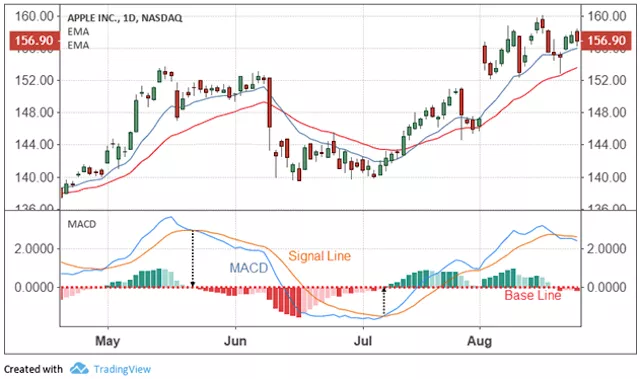

In [46]:
def macd(ticker):
    #data = info(ticker)
    data = df[ticker]
    period_long = 26
    period_short = 12
    period_signal = 9
    remove_cols = []
    data['ema' + str(period_long)] = data['Close'].ewm(ignore_na=False, min_periods=period_long, com=period_long, adjust=True).mean()
    remove_cols.append('ema' + str(period_long))
    data['ema' + str(period_short)] = data['Close'].ewm(ignore_na=False, min_periods=period_short, com=period_short, adjust=True).mean()
    remove_cols.append('ema' + str(period_short))
    data['macd'] = data['ema' + str(period_short)] - data['ema' + str(period_long)]
    data['signal_line'] = data['macd'].ewm(ignore_na=False, min_periods=0, com=period_signal, adjust=True).mean()
    data = data.drop(remove_cols, axis=1)
    
    return data

In [47]:
def macd_action(ticker):    # Trading action
    data = macd(ticker)
    data = data.reset_index(drop=False)
    r = data.shape[0]
    action = pd.DataFrame(np.zeros((r, 1)))
    action.columns = ['action']
    action['action'] = action['action'].astype(str)    

    action.at[0, 'action'] = 'NA'
    for i in range(1,r):
        # Cross up
        if data.at[i, 'macd'] >= data.at[i, 'signal_line'] and data.at[i-1, 'macd'] <= data.at[i-1, 'signal_line']:
            action.at[i, 'action'] = 'buy'
        # Cross down
        elif data.at[i, 'macd'] <= data.at[i, 'signal_line'] and data.at[i-1, 'macd'] >= data.at[i-1, 'signal_line']:
            action.at[i, 'action'] = 'sell'
        else:
            action.at[i, 'action'] = 'NA'

    data = pd.concat([data,action['action']], axis=1)
    data = data.set_index('Date')
    
    return data

def macd_action_date(ticker, date):  
    data = macd_action(ticker)
    if (date in data.index):
        result = data.at[date, 'action']
    else:
        result = print ('Date not exist')
        
    return result

In [48]:
macd('AAPL')

,Open,High,Low,Close,Adj Close,Volume,macd,signal_line
Date,,,,,,,,
2014-12-31,112.820000,113.129997,110.209999,110.379997,100.905785,41403400.0,NaN,NaN
2015-01-02,111.389999,111.440002,107.349998,109.330002,99.945885,53204600.0,NaN,NaN
2015-01-05,108.290001,108.650002,105.410004,106.250000,97.130241,64285500.0,NaN,NaN
2015-01-06,106.540001,107.430000,104.629997,106.260002,97.139420,65797100.0,NaN,NaN
2015-01-07,107.199997,108.199997,106.699997,107.750000,98.501518,40105900.0,NaN,NaN
...,...,...,...,...,...,...,...,...
2020-07-22,386.769989,391.899994,386.410004,389.089996,389.089996,22250400.0,21.868481,20.053555
2020-07-23,387.989990,388.309998,368.040009,371.380005,371.380005,49251100.0,21.030604,20.151260
2020-07-24,363.950012,371.880005,356.579987,370.459991,370.459991,46359700.0,20.189213,20.155055


In [49]:
macd_action('AAPL')

,Open,High,Low,Close,Adj Close,Volume,macd,signal_line,action
Date,,,,,,,,,
2014-12-31,112.820000,113.129997,110.209999,110.379997,100.905785,41403400.0,NaN,NaN,NA
2015-01-02,111.389999,111.440002,107.349998,109.330002,99.945885,53204600.0,NaN,NaN,NA
2015-01-05,108.290001,108.650002,105.410004,106.250000,97.130241,64285500.0,NaN,NaN,NA
2015-01-06,106.540001,107.430000,104.629997,106.260002,97.139420,65797100.0,NaN,NaN,NA
2015-01-07,107.199997,108.199997,106.699997,107.750000,98.501518,40105900.0,NaN,NaN,NA
...,...,...,...,...,...,...,...,...,...
2020-07-22,386.769989,391.899994,386.410004,389.089996,389.089996,22250400.0,21.868481,20.053555,NA
2020-07-23,387.989990,388.309998,368.040009,371.380005,371.380005,49251100.0,21.030604,20.151260,NA
2020-07-24,363.950012,371.880005,356.579987,370.459991,370.459991,46359700.0,20.189213,20.155055,NA


In [50]:
macd_action_date('AAPL','2015-03-10')

'sell'

In [51]:
def macd_fig(ticker):
    data = macd(ticker)
    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.25)
    fig.add_trace(go.Candlestick(x = data.index,
                                 open = data['Open'],
                                 high = data['High'],
                                 low = data['Low'],
                                 close = data['Close'],
                                 name = 'Stock price'), 
                  row = 1, col = 1)

    avg_14_adj = data.Close.rolling(window=14, min_periods=1).mean()
    fig.add_trace(go.Scatter(x = data.index, 
                             y = avg_14_adj,
                             line = dict(color='blue', width=1),
                             name = 'Close, 14-Day EMA'),
                  row = 1, col = 1)

    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['signal_line'],
                             line = dict(color = 'orange', width=1),
                             name = 'Signal line'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(x = data.index, 
                             y = data['macd'],
                             line = dict(color = 'green', width=1),
                             name = 'MACD'),
                  row = 2, col = 1)
    fig.add_trace(go.Scatter(x = data.index, 
                             y = np.zeros(data.shape[0]),
                             line = dict(color = 'red', width=1, dash='dash'),
                             name = 'Basic Line'),
                  row = 2, col = 1)
    fig.add_trace(go.Bar(x = data.index, 
                             y = data['macd'] - data['signal_line'],
                             marker_color ='red',
                             name = 'Signal Trading'),
                  row = 2, col = 1)

    fig.update_yaxes(title = "Stock Price", row = 1, col = 1, side = 'right')
    fig.update_yaxes(title = "MACD", row = 2, col = 1, side = 'right')
    fig.update_layout(title = ticker + ' Stock',
                     legend = dict(
        yanchor="top",
        y = 1.11,
        xanchor= "left",
        x = 0
    ))

    return fig.show()

In [52]:
macd_fig('AAPL')

## Aroon oscillator (Aroon Up & Aroon Down)

The Aroon Oscillator is a trend-following indicator that uses aspects of the Aroon Indicator (Aroon Up and Aroon Down) to gauge the strength of a current trend and the likelihood that it will continue. Readings above zero indicate that an uptrend is present, while readings below zero indicate that a downtrend is present.\

The Aroon indicator is a technical indicator that is used to identify trend changes in the price of an asset, as well as the strength of that trend. In essence, the indicator measures the time between highs and the time between lows over a time period. The idea is that strong uptrends will regularly see new highs, and strong downtrends will regularly see new lows. The indicator signals when this is happening, and when it isn't.\

The indicator consists of the "Aroon up" line, which measures the strength of the uptrend, and the "Aroon down" line, which measures the strength of the downtrend.

\begin{aligned} &\text{Aroon Oscillator}=\text{Aroon Up}-\text{Aroon Down}\\ &\text{Aroon Up}=100*\frac{\left(25 - \text{Periods Since 25-Period High}\right)}{25}\\ &\text{Aroon Down}=100*\frac{\left(25 - \text{Periods Since 25-Period Low}\right)}{25}\\ \end{aligned} 

When the oscillator moves above the zero line it means the Aroon Up is crossing above the Aroon Down. This means the price has made a high more recently than a low. That could be a sign that an uptrend is starting.

When the oscillator moves below zero, it means the Aroon Down is crossing below the Aroon Up. A low occurred more recently than a high, which could signal a downtrend is starting.

In [53]:
def aroon_info(ticker, tf=25):
    data_today=df[ticker]
    aroonup = []
    aroondown = []
    aroonos = []
    x = tf
    data_today['High'].fillna(0, inplace = True)
    data_today['Low'].fillna(0, inplace = True)
    while x < len(data_today.index):
        aroon_up = ((data_today['High'][x-tf:x].tolist().index(max(data_today['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((data_today['Low'][x-tf:x].tolist().index(min(data_today['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x +=1
    zip_aroon = zip(aroonup, aroondown)
    for list1, list2 in zip_aroon:
        aroonos.append(list1 - list2)
    zeros = [0] * 25
    if len(aroonos) == 0:
        aroonos = [0]*data_today['Close'].shape[0]
    else: aroonos = zeros + aroonos
    data_today['Aroon'] = np.array(aroonos)
    for i in data_today.index:
        if data_today.loc[i,'Aroon'] == 0:
            dif = data_today.loc[i,'Aroon'] - data_today.shift(periods=1).loc[i,'Aroon']
            if dif < 0:
                data_today.loc[i,'Aroon_sig'] = 'New uptrend'
            elif dif > 0:
                data_today.loc[i,'Aroon_sig'] = 'New downtrend'
        elif (data_today.loc[i,'Aroon'] <40 and data_today.loc[i,'Aroon'] >-40):
            data_today.loc[i,'Aroon_sig'] = 'Consolidate market'
        elif data_today.loc[i,'Aroon'] >=40:
            data_today.loc[i,'Aroon_sig'] = 'Strong uptrend'
        elif data_today.loc[i,'Aroon'] <= -40:
            data_today.loc[i,'Aroon_sig'] = 'Strong downtrend'
    #data_today.drop(['Open','High','Low','Close','Adj Close','Volume','Aroon'], axis = 1, inplace = True)
    #index = data_today.index
    #fig = go.Figure()
    #fig.add_trace(go.Scatter(x=index, y= data_today['Aroon'], mode = 'lines', name = 'Aroon Oscillator'))
    #fig.add_trace(go.Scatter(x=index, y=data_today['Close'], mode = 'lines+markers', name = 'Closing price'))
    #fig.update_layout(title= 'Closing price and the Aroon Oscillator',
                  #showlegend=False,
#                   autosize=False, width=950,height=800,
                  #)
    #fig.show()
    return data_today['Aroon_sig']


In [54]:
aroon_info('AAPL',tf=25)

Date
2014-12-31               NaN
2015-01-02               NaN
2015-01-05               NaN
2015-01-06               NaN
2015-01-07               NaN
                   ...      
2020-07-22    Strong uptrend
2020-07-23    Strong uptrend
2020-07-24    Strong uptrend
2020-07-27    Strong uptrend
2020-07-28    Strong uptrend
Name: Aroon_sig, Length: 1408, dtype: object

##  Relative Strength Index (RSI)

The relative strength index (RSI) is a momentum indicator used in technical analysis that measures the magnitude of recent price changes to evaluate overbought or oversold conditions in the price of a stock or other asset. The RSI is displayed as an oscillator (a line graph that moves between two extremes) and can have a reading from 0 to 100. 

The RSI provides technical traders signals about bullish and bearish price momentum, and it is often plotted beneath the graph of an asset's price.

An asset is usually considered overbought when the RSI is above 70% and oversold when it is below 30%.

Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100<br> 
Where: PriceUp(t)=1\*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0}<br>
PriceDown(t)=-1\*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0}<br>

In [55]:
def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)

In [56]:
def cal_rsi(ticker):
    data_today=df[ticker]
    momentum_1d = []
    RSI = []
    momentum_1d = (data_today['Close'] - data_today['Close'].shift(1)).fillna(0)
    RSI = momentum_1d.rolling(center=False, window = 14).apply(rsi).fillna(0)
    return data_today, momentum_1d, RSI

In [57]:
def RSI_info(ticker):
    data_today, momentum, RSI = cal_rsi(ticker)
    for i in RSI.index:
        if RSI[i] > 70:
            data_today['RSI_sig'] = 'Sell'
        elif RSI[i] < 30 :
            data_today['RSI_sig'] = 'Buy'
        else: data_today['RSI_sig'] = 'Hold'
    #data_today.drop(['Open','High','Low','Close','Adj Close','Volume'], axis = 1, inplace = True)
    #fig = go.Figure()
    #index = data_today.index
    #fig.add_trace(go.Scatter(x=index, y= RSI, mode = 'lines', name = 'Relative Strength Index'))
    #fig.add_trace(go.Scatter(x=index, y=data_today['Close'], mode = 'lines+markers', name = 'Closing price'))
    #fig.update_layout(title= 'Closing price and relative strength index (RSI)',
                  #showlegend=False,
#                   autosize=False, width=950,height=800,
                  #)
    #fig.show()
    return data_today['RSI_sig']

In [58]:
RSI_info('AAPL')

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:6: FutureWarning:

Currently, 'apply' passes the values as ndarrays to the applied function. In the future, this will change to passing it as Series objects. You need to specify 'raw=True' to keep the current behaviour, and you can pass 'raw=False' to silence this warning



Date
2014-12-31    Hold
2015-01-02    Hold
2015-01-05    Hold
2015-01-06    Hold
2015-01-07    Hold
              ... 
2020-07-22    Hold
2020-07-23    Hold
2020-07-24    Hold
2020-07-27    Hold
2020-07-28    Hold
Name: RSI_sig, Length: 1408, dtype: object

## Stochastic Oscillator

## Bollinger Band (insted of trading breakouts)

https://www.investopedia.com/terms/b/bollingerbands.asp

A Bollinger Band® is a technical analysis tool defined by a set of trendlines plotted two standard deviations (positively and negatively) away from a simple moving average (SMA) of a security's price, but which can be adjusted to user preferences.

Bollinger Bands® are a highly popular technique. Many traders believe the closer the prices move to the upper band, the more overbought the market, and the closer the prices move to the lower band, the more oversold the market.

In the chart depicted below, Bollinger Bands® bracket the 20-day SMA of the stock with an upper and lower band along with the daily movements of the stock's price. Because standard deviation is a measure of volatility, when the markets become more volatile the bands widen; during less volatile periods, the bands contract.

![image](https://www.investopedia.com/thmb/gvlXmWskHGDZvNuPRNQdkxO-DY0=/1543x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/BollingerBands-5c535dc646e0fb00013a1b8b.png)

Bollinger Band formular:
$$BOLU = MA(TP,n) + m*\sigma[TP,n]$$

$$BOLD = MA(TP,n) - m*\sigma[TP,n]$$

- BOLU = Upper Bollinger band
- BOLD = Lower Bollinger band
- MA = Moving average
- TP (typical price) = (High + Low + Close)/3
- n = Number of days in smoothing period (typically 20)
- m = Number of standard deviations (typically 2)
- $\sigma[TP,n]$ = Standard Deviations over last n periods of TP

In [59]:
##trade strategy: against market trend, "be fearful when others are greedy, and greedy when others are fearful"

def graph_BB(app):

    fig = go.Figure()
    # fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.23)

    #Plot candle stick for stock price
    fig.add_trace(go.Candlestick(x=app.index,
                                 open=app['Open'],
                                 high=app['High'],
                                 low=app['Low'],
                                 close=app['Close'],
                                 name = 'Stock price'))

    fig.update_yaxes(title="Apple Stock", side='right')

    #Plot Bollinger Bands
    fig.add_trace(go.Scatter(x=app.index,
                             y=app['BOLU'],
                             fill='none',
                             fillcolor='rgba(231,107,243,0.2)',
                             line_color='rgba(255,255,255,0)',
                             showlegend=False,
                             name='BB Up',
                             ))
    fig.add_trace(go.Scatter(x=app.index,
                             y=app['BOLD'],
                             fill='tonexty',
                             fillcolor='rgba(231,107,243,0.2)',
                             line_color='rgba(255,255,255,0)',
                             showlegend=False,
                             name='BB Down',
                             ))


    fig.add_trace(go.Scatter(x=app.index, 
                             y=app['MA20-TP'],
                             line_color='rgb(231,107,243)',
                             name='MA 20 - Typical Price',
                             ))

    #Plot Sell signal
    fig.add_trace(go.Scatter(x=app[app['R'] == 'Sell'].index, 
                                     y=app['High'][app['R'] == 'Sell'],
                                     mode='markers',
                                     marker=dict(symbol = 6, size=10, color = 'red'),
                                     name='Sell signal'))
    #Plot Buy signal
    fig.add_trace(go.Scatter(x=app[app['R'] == 'Buy'].index, 
                                     y=app['Low'][app['R'] == 'Buy'],
                                     mode='markers',
                                     marker=dict(symbol = 5, size=10, color = 'green'),
                                     name='Buy signal'))

    #Layout 
    fig.update_layout(title='Stock since 2015',
    #                   showlegend=False,
                      autosize=False, width=950,height=800,
                      legend = dict(yanchor="top",y = 1,
                                    xanchor= "right", x = 1.3))

    # fig.add_annotation(x=d,y=app.loc[d,'Close'],
    #                    xref="x",yref="y",
    #                    text=app.loc[d,'Close'].round(1),
    #                    align="right",
    #                    bgcolor="#ff7f0e",
    #                    opacity=0.8)
    fig.show()
    
def BB(ticker):
    n = 20
    data = df[ticker]
    data['TP'] = (data['High']+data['Low']+data['Close'])/3
    data['MA20-TP'] = data['TP'].rolling(window=n).mean()
    index = data.index
    for i in range(n,len(index)):
        ds = index[i-n]
        d = index[i]
        data1= data.loc[ds:d,'TP']
        data.loc[d,'Std'] = data1.std()
    
    #Calculate upper and lower band
    data['BOLU'] = data['MA20-TP'] + 2*data['Std']
    data['BOLD'] = data['MA20-TP'] - 2*data['Std']
    data['R'] = np.nan
    
    #Identity market trend and decision
    index = data.index
    p = 0.6 #if p increase then target_price up and down move closer to MA20 line
    for i in range(n,len(index)):
        ds = index[i-n]
        d = index[i]
        dff = data.loc[ds:d,:]
        M_L20 = dff['Low'].min()
        M_H20 = dff['High'].max()
        C_L = data.loc[d,'Low']
        C_H = data.loc[d,'High']
        target_price_up = data.loc[d,'BOLU']-2*p*data.loc[d,'Std']
        target_price_down = data.loc[d,'BOLD']+2*p*data.loc[d,'Std']
        
        if C_L <= M_L20 and C_H <= M_H20: #condition identify market down trend
            data.loc[d,'M_trend'] = 'bear'
#             data.loc[d,'R'] = 'Sell'
            if data.loc[d,'High']>= target_price_up:#sell when price is near up band
                data.loc[d,'R'] = 'Sell'
        
        if C_L >= M_L20 and C_H >= M_H20: #condition identify market up trend
            data.loc[d,'M_trend'] = 'bull'
#             data.loc[d,'R'] = 'Buy'
            if data.loc[d,'Low']<= target_price_down:#buy when price is near down band
                data.loc[d,'R'] = 'Buy'
    
    
    graph_BB(data)
    data_r = data['R']
    return data, data_r
    
app, app_r = BB('FB')        
app[app['R'].isnull() == False]   

,Open,High,Low,Close,Adj Close,Volume,TP,MA20-TP,Std,BOLU,BOLD,R,M_trend
Date,,,,,,,,,,,,,
2017-06-09,154.770004,155.589996,146.610001,149.600006,149.600006,35577700.0,150.600001,150.708501,2.292776,155.294053,146.122948,Buy,bull
2017-11-29,181.889999,181.970001,174.000000,175.130005,175.130005,41933500.0,177.033335,179.734000,1.677090,183.088180,176.379821,Sell,bear


## Money Flow Index (MFI)

This method only show market trend

https://www.investopedia.com/terms/m/mfi.asp

The Money Flow Index (MFI) is a technical indicator that generates overbought or oversold signals using both prices and volume data.

An MFI reading above 80 is considered overbought and an MFI reading below 20 is considered oversold, although levels of 90 and 10 are also used as thresholds.

A divergence between the indicator and price is noteworthy. For example, if the indicator is rising while the price is falling or flat, the price could start rising.

$$Money Flow Index (MFI) = 100 - \frac{100}{1+ Money Flow Ratio}$$

- Money Flow Ratio = $\frac{14 Period Positive Money Flow}{14 Period Negative Money Flow}$

- Raw Money Flow = Typical Price * Volumn
- Typical Price = $\frac {High + Low + Close}{3}$

In [60]:
from datetime import timedelta
def graph_MFI(app):

    fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.23)

    #Plot candle stick for stock price
    fig.add_trace(go.Candlestick(x=app.index,
                                 open=app['Open'],
                                 high=app['High'],
                                 low=app['Low'],
                                 close=app['Close'],
                                 name = 'Stock price'), 
                  row = 1, col = 1)
    fig.update_yaxes(title="Apple Stock", row=1, col=1, side='right')

    #Plot MFI
    fig.add_trace(go.Scatter(x=app.index, 
                             y=app['MFI'],
                             mode='lines',
                             line_width=1,
                             name='MFI'),
                  row = 2, col = 1)

    fig.update_yaxes(title_text="MFI",
                     range=[-10, 110], 
                     row=2, col=1, side='right')

    #Layout 

    fig.update_layout(title='Stock since 2015',
#                       showlegend=False,
    #                   autosize=False, width=950,height=800,
                      shapes=[dict(type="rect",
                                   xref="x1",# x-reference is assigned to the x-values
                                   yref="y2",  # y-reference is assigned to the plot paper [0,1]
                                   x0="2014-12-31", y0=10,
                                   x1=date.today(), y1=20,
                                   fillcolor="salmon",
                                   opacity=0.5,
                                   layer="below",
                                   line_width=0,),
                              dict(type="rect",
                                   xref="x1",# x-reference is assigned to the x-values
                                   yref="y2",  # y-reference is assigned to the plot paper [0,1]
                                   x0="2014-12-31", y0=80,
                                   x1=date.today(), y1=90,
                                   fillcolor="salmon",
                                   opacity=0.5,
                                   layer="below",
                                   line_width=0,),
                              dict(type="rect",
                                   xref="x1",# x-reference is assigned to the x-values
                                   yref="y2",  # y-reference is assigned to the plot paper [0,1]
                                   x0="2014-12-31", y0=20,
                                   x1=date.today(), y1=80,
                                   fillcolor="rgba(231,107,243,0.2)",
                                   opacity=0.5,
                                   layer="below",
                                   line_width=0,)],
                     legend = dict(yanchor="top",y = 1,
                                   xanchor= "right", x = 1.3))

    d = date.today() - timedelta(days=1)

    # fig.add_annotation(x=d,y=app.loc[d,'Close'],
    #                    xref="x1",yref="y1",
    #                    text=app.loc[d,'Close'].round(1),
    #                    align="right",
    #                    bgcolor="#ff7f0e",
    #                    opacity=0.8)
    fig.show()



def MFI(ticker):
    data = df[ticker]
    data['TP'] = (data['High'] + data['Low'] + data['Close'])/3
    
    index = data.index
    for i in range(1,len(index)):
        d = index[i]
        a = data.loc[:d,'TP']
        if a[-2] >= a[-1]:
            data.loc[d,'RMF_s'] = -1
        elif a[-2] < a[-1]:
            data.loc[d,'RMF_s'] = 1
        data.loc[d,'RMF'] = data.loc[d,'TP'] * data.loc[d,'Volume']*data.loc[d,'RMF_s']

    for i in range(15,len(index)):
        d14 = index[i-15]
        d = index[i]
        P = []
        N = []
        for v in data.loc[d14:d,'RMF']:
            if v >= 0:
                P.append(v)
            elif v!= np.nan and v<0:
                N.append(v)
        MFR = abs((sum(P))/(sum(N)))
        MFI = 100-(100/(1+MFR))
        data.loc[d,'MFI'] = MFI
        if data.loc[d,'MFI'] >= 80:
            data.loc[d,'M_trend'] = 'overbought'
        elif data.loc[d,'MFI'] <= 20:
            data.loc[d,'M_trend'] = 'oversold'
            
    graph_MFI(data)
    
    return data

In [61]:
MFI('AAPL')

,Open,High,Low,Close,Adj Close,Volume,TP,RMF_s,RMF,MFI,M_trend
Date,,,,,,,,,,,
2014-12-31,112.820000,113.129997,110.209999,110.379997,100.905785,41403400.0,111.239998,NaN,NaN,NaN,NaN
2015-01-02,111.389999,111.440002,107.349998,109.330002,99.945885,53204600.0,109.373334,-1.0,-5.819164e+09,NaN,NaN
2015-01-05,108.290001,108.650002,105.410004,106.250000,97.130241,64285500.0,106.770002,-1.0,-6.863763e+09,NaN,NaN
2015-01-06,106.540001,107.430000,104.629997,106.260002,97.139420,65797100.0,106.106667,-1.0,-6.981511e+09,NaN,NaN
2015-01-07,107.199997,108.199997,106.699997,107.750000,98.501518,40105900.0,107.549998,1.0,4.313389e+09,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2020-07-22,386.769989,391.899994,386.410004,389.089996,389.089996,22250400.0,389.133331,-1.0,-8.658372e+09,71.010221,NaN
2020-07-23,387.989990,388.309998,368.040009,371.380005,371.380005,49251100.0,375.910004,-1.0,-1.851398e+10,62.125391,NaN
2020-07-24,363.950012,371.880005,356.579987,370.459991,370.459991,46359700.0,366.306661,-1.0,-1.698187e+10,54.805514,NaN


## Final result

In [62]:
def trading_decision(ticker, sma_period):
    ADX = adx_action(ticker)
    SMA = sma_action(ticker, sma_period)
    MACD = macd_action(ticker)
    TradingDecision = pd.concat([ADX['action'],SMA['action'],MACD['action']], axis=1)
    TradingDecision.columns = ['ADX','SMA','MACD']
    TradingDecision.columns = pd.MultiIndex.from_product([['%s'%ticker],TradingDecision.columns])
    return TradingDecision

In [63]:
trading_decision('FB', 15)

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered



FB           
                                     ADX   SMA MACD
Date                                               
2014-12-31                            NA    NA   NA
2015-01-02          weak possible to buy   buy   NA
2015-01-05   very strong possible to buy  sell   NA
2015-01-06                            NA    NA   NA
2015-01-07  very strong possible to sell    NA   NA
...                                  ...   ...  ...
2020-07-22                            NA  sell   NA
2020-07-23                            NA    NA   NA
2020-07-24                            NA    NA   NA
2020-07-27                            NA    NA   NA
2020-07-28                            NA    NA   NA

[1408 rows x 3 columns]

In [64]:
# All 505 companies but example for 100 companies
Symbol = dt['Ticker'] 
stock_trading = trading_decision(Symbol[0], 15)
for i in range(1, 100):
    stock = trading_decision(Symbol[i], 15)
    stock_trading = pd.concat([stock_trading, stock], axis=1)

stock_trading

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning:

All-NaN axis encountered

C:\Users\ducng\anaconda3\lib\site-packages\ipykernel_launcher.py:15: RuntimeWarning:

All-NaN axis encountered



MSFT              \
                                     ADX   SMA  MACD   
Date                                                   
2014-12-31                            NA    NA    NA   
2015-01-02  very strong possible to sell   buy    NA   
2015-01-05                            NA  sell    NA   
2015-01-06                            NA    NA    NA   
2015-01-07                            NA    NA    NA   
...                                  ...   ...   ...   
2020-07-22                            NA    NA    NA   
2020-07-23                            NA  sell  sell   
2020-07-24                            NA    NA    NA   
2020-07-27                            NA    NA    NA   
2020-07-28                            NA    NA    NA   

                                    AAPL              \
                                     ADX   SMA  MACD   
Date                                                   
2014-12-31                            NA    NA    NA   
2015-01-02          weak possible to buy  sell    NA   
2015-01-05          weak possible to buy    NA    NA   
2015-01-06          weak possible to buy    NA    NA   
2015-01-07  very strong possible to sell    NA    NA   
...                                  ...   ...   ...   
2020-07-22                            NA    NA    NA   
2020-07-23                            NA  sell    NA   
2020-07-24                            NA    NA    NA   
2020-07-27                            NA    NA  sell   
2020-07-28                            NA    NA    NA   

                                    AMZN             \
                                     ADX   SMA MACD   
Date                                                  
2014-12-31                            NA    NA   NA   
2015-01-02   very strong possible to buy  sell   NA   
2015-01-05                            NA    NA   NA   
2015-01-06                            NA    NA   NA   
2015-01-07  very strong possible to sell    NA   NA   
...                                  ...   ...  ...   
2020-07-22                            NA    NA   NA   
2020-07-23                            NA  sell   NA   
2020-07-24                            NA    NA   NA   
2020-07-27                            NA    NA   NA   
2020-07-28                            NA    NA   NA   

                                      FB  ...  DUK                  ATVI  \
                                     ADX  ... MACD                   ADX   
Date                                      ...                              
2014-12-31                            NA  ...   NA                    NA   
2015-01-02          weak possible to buy  ...   NA  weak possible to buy   
2015-01-05   very strong possible to buy  ...   NA  weak possible to buy   
2015-01-06                            NA  ...   NA  weak possible to buy   
2015-01-07  very strong possible to sell  ...   NA  weak possible to buy   
...                                  ...  ...  ...                   ...   
2020-07-22                            NA  ...   NA                    NA   
2020-07-23                            NA  ...  buy                    NA   
2020-07-24                            NA  ...   NA                    NA   
2020-07-27                            NA  ...   NA                    NA   
2020-07-28                            NA  ...   NA                    NA   

                                               TGT             \
             SMA MACD                          ADX   SMA MACD   
Date                                                            
2014-12-31    NA   NA                           NA    NA   NA   
2015-01-02  sell   NA         weak possible to buy  sell   NA   
2015-01-05    NA   NA         weak possible to buy    NA   NA   
2015-01-06    NA   NA         weak possible to buy    NA   NA   
2015-01-07    NA   NA  very strong possible to buy   buy   NA   
...          ...  ...                          ...   ...  ...   
2020-07-22    NA   NA                        

In [65]:
def EvaluationMethod(ticker, method, sma_period): # method = adx, sma, macd
    if method == 'sma':
        data = sma_action(ticker, sma_period)
        fig = ma_fig(ticker, sma_period)
    else:
        data = eval(method + '_action')(ticker)
        fig = eval(method + '_fig')(ticker)
    return (data, fig)

In [66]:
EvaluationMethod('AAPL','macd',15)

(                  Open        High         Low       Close   Adj Close  \
 Date                                                                     
 2014-12-31  112.820000  113.129997  110.209999  110.379997  100.905785   
 2015-01-02  111.389999  111.440002  107.349998  109.330002   99.945885   
 2015-01-05  108.290001  108.650002  105.410004  106.250000   97.130241   
 2015-01-06  106.540001  107.430000  104.629997  106.260002   97.139420   
 2015-01-07  107.199997  108.199997  106.699997  107.750000   98.501518   
 ...                ...         ...         ...         ...         ...   
 2020-07-22  386.769989  391.899994  386.410004  389.089996  389.089996   
 2020-07-23  387.989990  388.309998  368.040009  371.380005  371.380005   
 2020-07-24  363.950012  371.880005  356.579987  370.459991  370.459991   
 2020-07-27  374.839996  379.619995  373.920013  379.239990  379.239990   
 2020-07-28  377.470001  378.200012  372.989990  373.010010  373.010010   
 
                 Volume